# <p style='text-align: center;'> Kidney Stone Prediction based on Urine Analysis </p>

## Business Problem Understanding
The objective of this analysis is to develop ML/DL models to predict occurrence of kidney stones. We have collected this dataset from the kaggle. This dataset can be used to predict the presence of kidney stones based on urine analysis. 

This csv file contains 6 input attributes and a single target column with binary values. The 79 urine specimens, were analyzed in an effort to determine if certain physical characteristics of the urine might be related to the formation of calcium oxalate crystals.

The six physical characteristics of the urine are:

1. specific gravity, the density of the urine relative to water.


2. pH, the negative logarithm of the hydrogen ion.


3. osmolarity (mOsm), a unit used in biology and medicine but not in physical chemistry. Osmolarity is proportional to the concentration of molecules in solution.


4. conductivity (mMho milliMho). One Mho is one reciprocal Ohm. Conductivity is proportional to the concentration of charged ions in solution.


5. urea concentration in millimoles per litre.


6. calcium concentration (CALC) in millimolesllitre.


## Importing the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.graph_objs as go

## Load the dataset

In [2]:
# Load the dataset.
df = pd.read_csv('kidney_stone_data.csv')

In [3]:
# Display the first 5 rows of a DataFrame (df)
df.head()

,id,gravity,ph,osmo,cond,urea,calc,target
0,0,1.013,6.19,443,14.8,124,1.45,0
1,1,1.025,5.40,703,23.6,394,4.18,0
2,2,1.009,6.13,371,24.5,159,9.04,0
3,3,1.021,4.91,442,20.8,398,6.63,1
4,4,1.021,5.53,874,17.8,385,2.21,1


In [4]:
# Display the first 5 rows of a DataFrame (df)
df.tail()

,id,gravity,ph,osmo,cond,urea,calc,target
409,409,1.011,5.21,527,21.4,75,1.53,0
410,410,1.024,5.53,577,19.7,224,0.77,0
411,411,1.018,6.28,455,22.2,270,7.68,1
412,412,1.008,7.12,325,12.6,75,1.03,1
413,413,1.011,6.13,364,9.9,159,0.27,0


In [5]:
# Let’s have a look at data dimensionality.
df.shape

(414, 8)

In [6]:
# Let’s have a look at the column labels (column names).
df.columns

Index(['id', 'gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target'], dtype='object')

In [7]:
# Check the duplicate records.
df.duplicated().sum()

0

In [8]:
# Check the missing values records.
df.isnull().sum()

id         0
gravity    0
ph         0
osmo       0
cond       0
urea       0
calc       0
target     0
dtype: int64

In [9]:
# Let's have a look at the general information about the dataframe 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       414 non-null    int64  
 1   gravity  414 non-null    float64
 2   ph       414 non-null    float64
 3   osmo     414 non-null    int64  
 4   cond     414 non-null    float64
 5   urea     414 non-null    int64  
 6   calc     414 non-null    float64
 7   target   414 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 26.0 KB


In [10]:
df.describe()

,id,gravity,ph,osmo,cond,urea,calc,target
count,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000
mean,206.500000,1.017894,5.955459,651.545894,21.437923,278.657005,4.114638,0.444444
std,119.655756,0.006675,0.642260,234.676567,7.514750,136.442249,3.217641,0.497505
min,0.000000,1.005000,4.760000,187.000000,5.100000,10.000000,0.170000,0.000000
25%,103.250000,1.012000,5.530000,455.250000,15.500000,170.000000,1.450000,0.000000
50%,206.500000,1.018000,5.740000,679.500000,22.200000,277.000000,3.130000,0.000000
75%,309.750000,1.022000,6.280000,840.000000,27.600000,385.000000,6.630000,1.000000
max,413.000000,1.040000,7.940000,1236.000000,38.000000,620.000000,14.340000,1.000000


In [11]:
df.nunique()

id         414
gravity     28
ph          71
osmo        80
cond        65
urea        73
calc        85
target       2
dtype: int64

In [12]:
df = df.drop('id', axis = 1)

In [13]:
df['target'].unique()

array([0, 1], dtype=int64)

In [14]:
df['target'].value_counts()

0    230
1    184
Name: target, dtype: int64

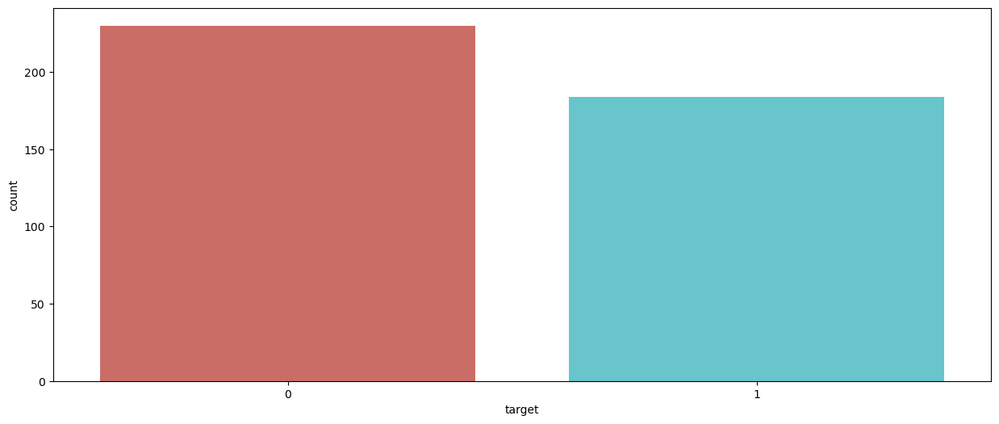

In [15]:
plt.figure(figsize=(15,6))
sns.countplot(df['target'], data = df, palette = 'hls')
plt.show()

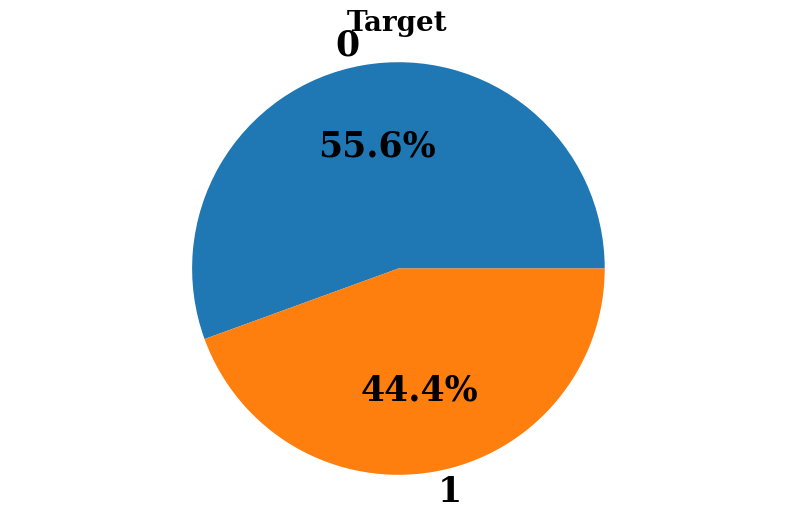

In [16]:
# Calculate the data and labels for the pie chart
data = df['target'].value_counts()
labels = df['target'].value_counts().index

# Create a figure and set its size
plt.figure(figsize=(10, 6))

# Set the title
hfont = {'fontname': 'serif', 'weight': 'bold'}
plt.title('Target', size=20, **hfont)

# Create the pie chart
plt.pie(data, labels=labels, autopct='%1.1f%%', textprops={'fontsize': 25, 'color': 'black', 'weight': 'bold', 
                                                                                             'family': 'serif'})

# Set aspect ratio to equal for a perfect circle
plt.axis('equal')

# Show the plot
plt.show()


In [17]:
import plotly.express as px

fig = px.bar(df, x="target", y= df.index)
fig.show()

In [18]:
value_counts = df['target'].value_counts()
fig = px.pie(names=value_counts.index, values=value_counts.values)
fig.update_layout(
    title='Pie Chart of Target',
    title_x=0.5
)
fig.show()

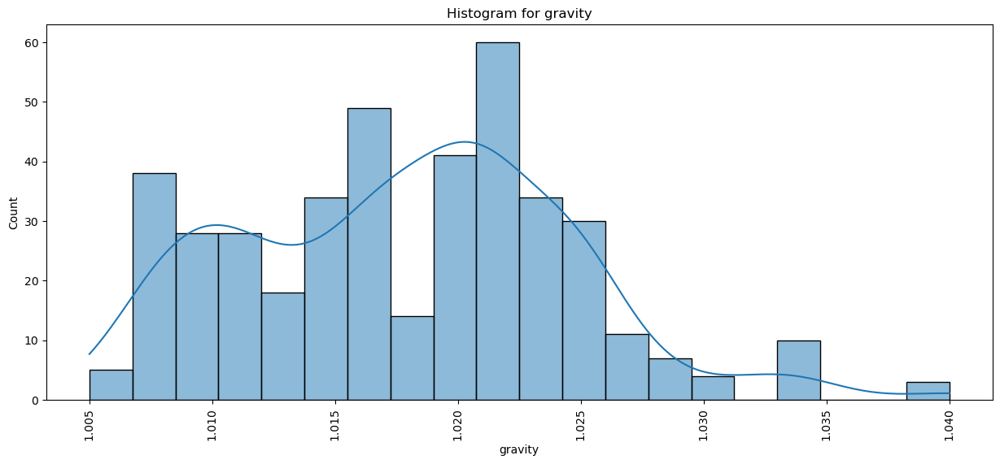

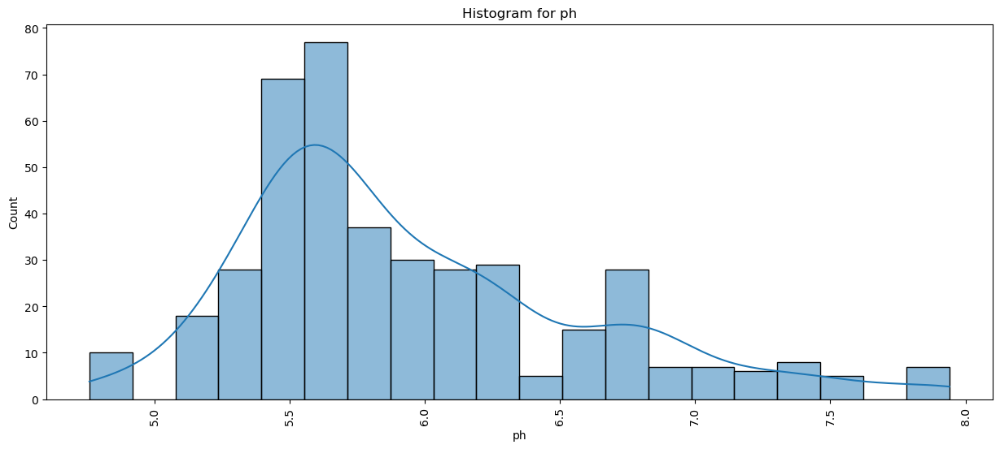

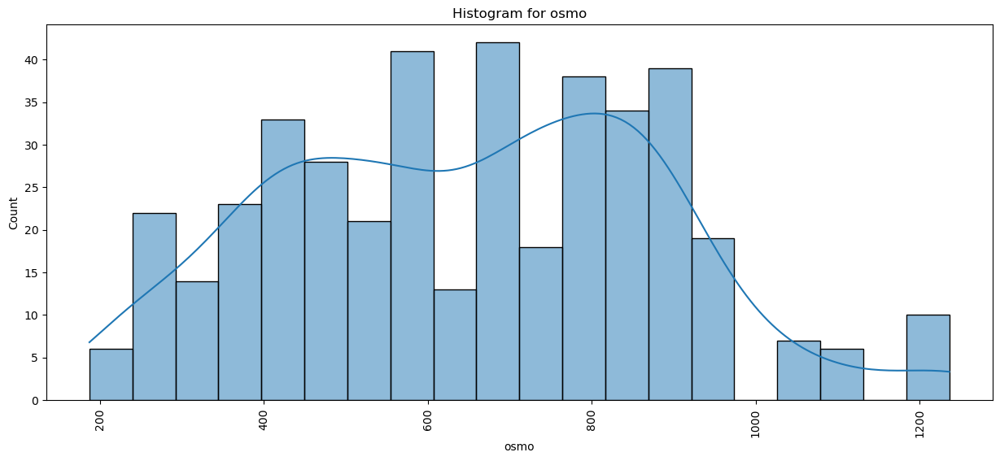

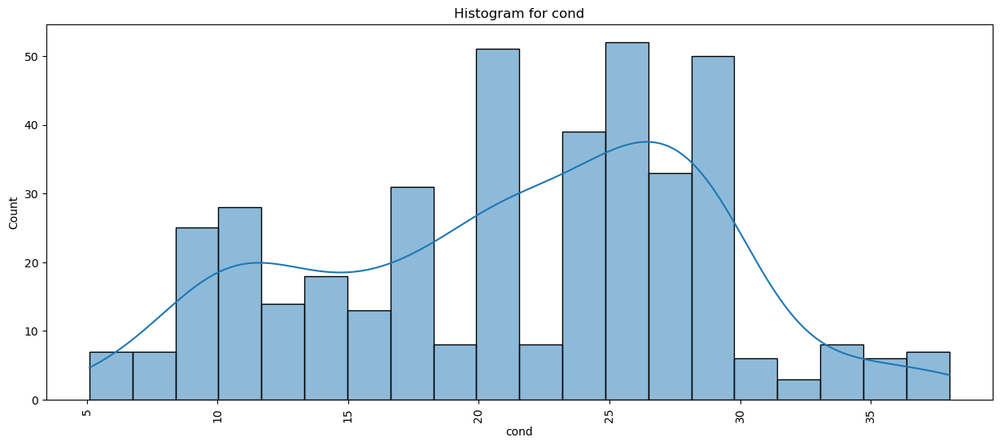

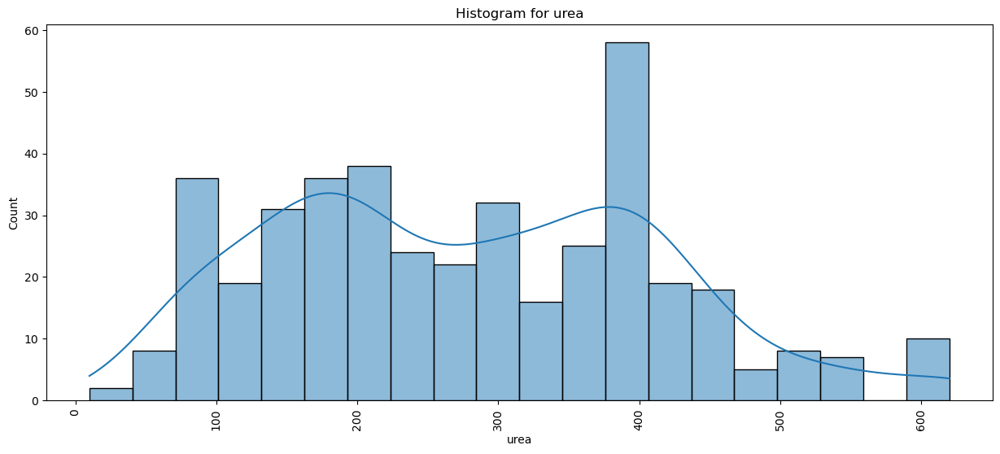

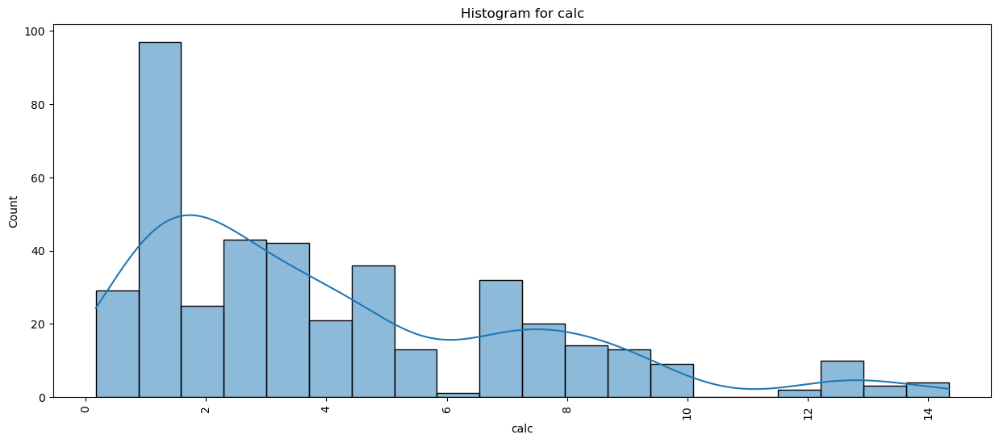

In [19]:
# Display the histograms for all independent columns using Seaborn library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a new figure for each plot
        plt.figure(figsize=(15, 6))
        
        # Create a histogram using seaborn
        sns.histplot(df[i], kde=True, bins=20, palette='hls')
        
        # Customize the plot as needed
        plt.xticks(rotation=90)
        plt.title(f'Histogram for {i}')
        
        # Display the plot
        plt.show()


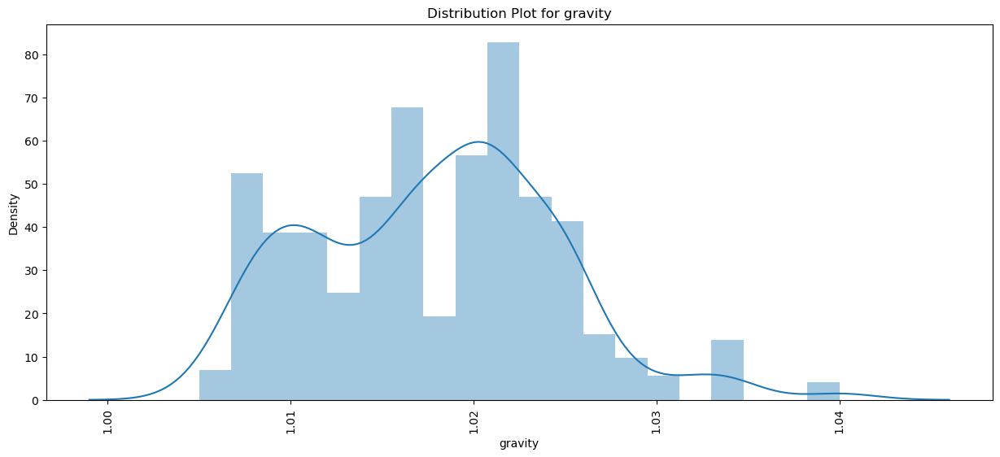

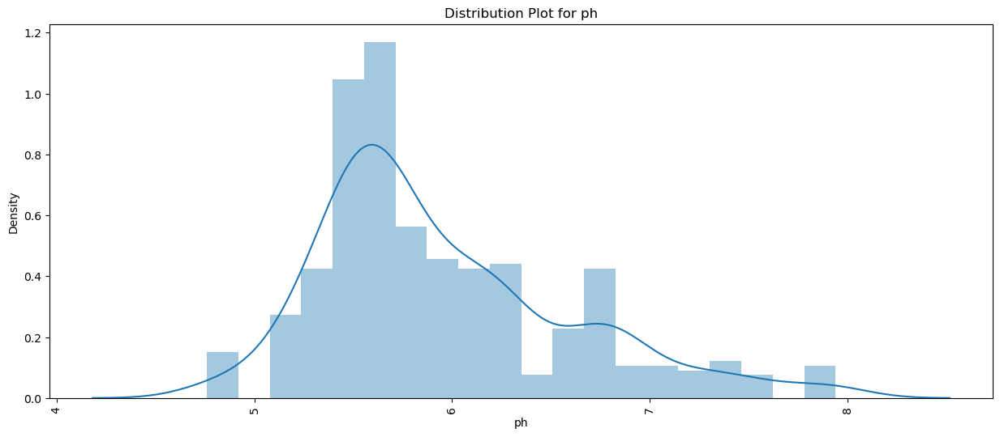

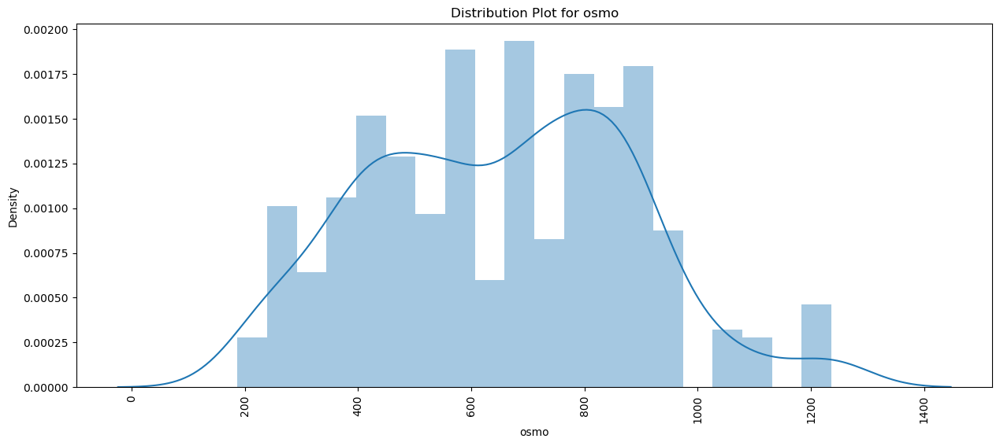

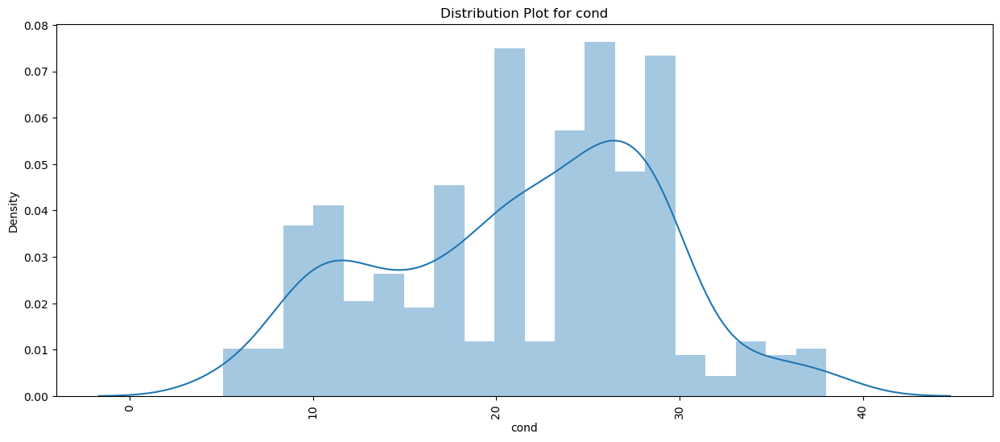

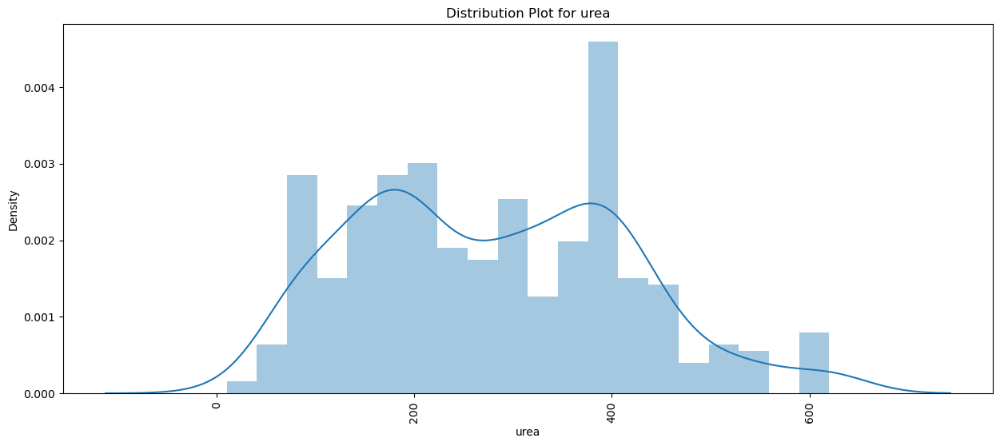

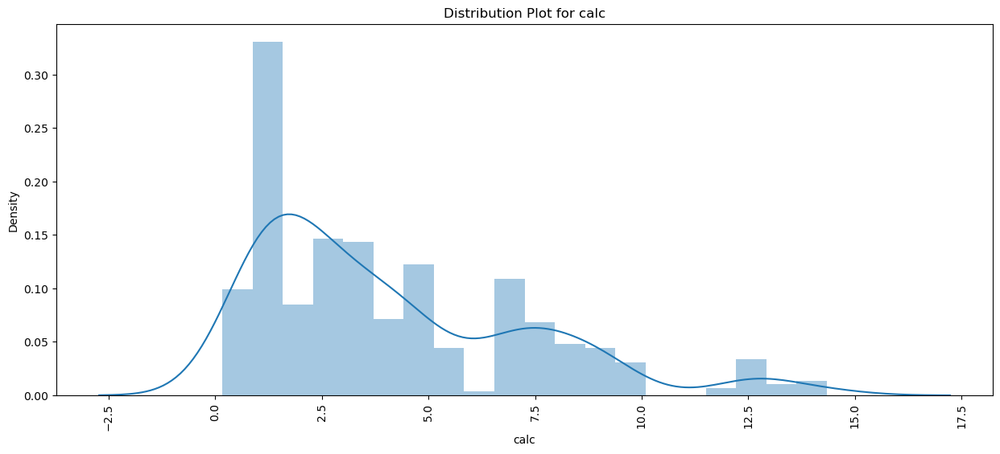

In [20]:
# Display the distribution plots for all independent columns using Seaborn library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a new figure for each plot
        plt.figure(figsize=(15, 6))
        
        # Create a distribution plot using seaborn
        sns.distplot(df[i], kde=True, bins=20)
        
        # Customize the plot as needed
        plt.xticks(rotation=90)
        plt.title(f'Distribution Plot for {i}')
        
        # Display the plot
        plt.show()


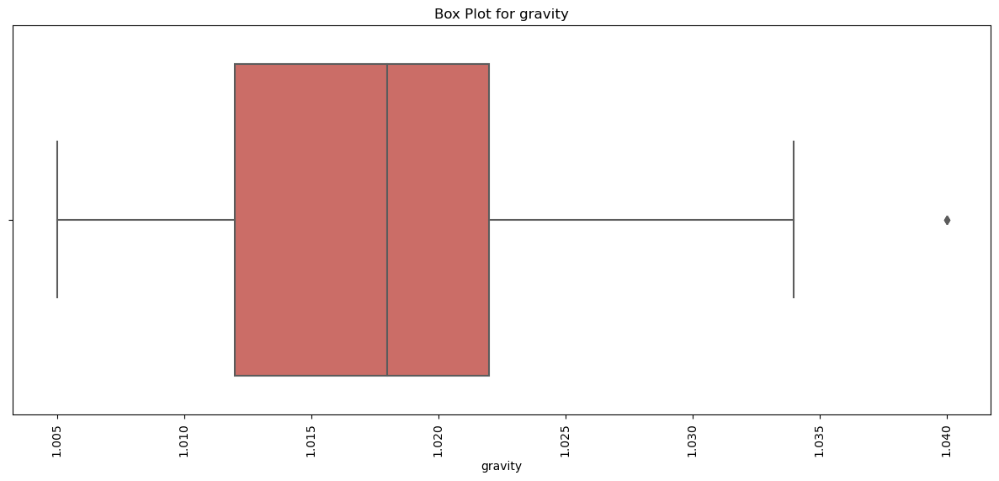

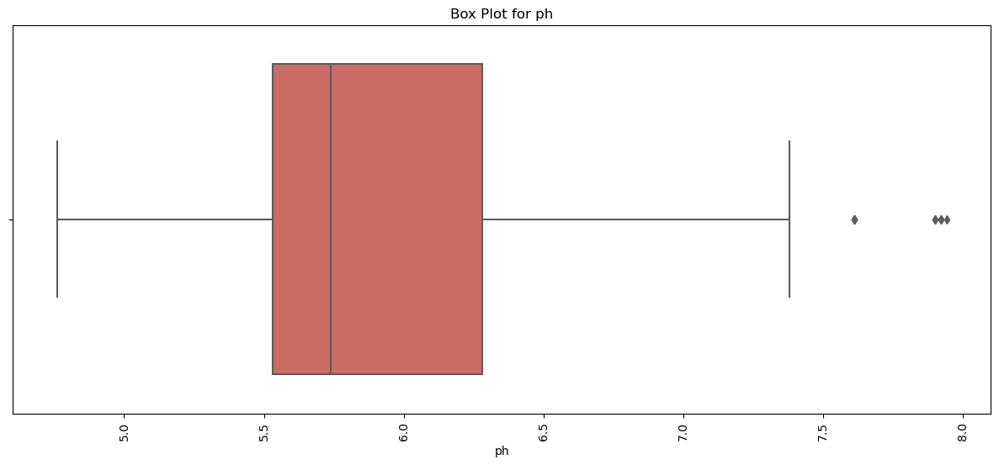

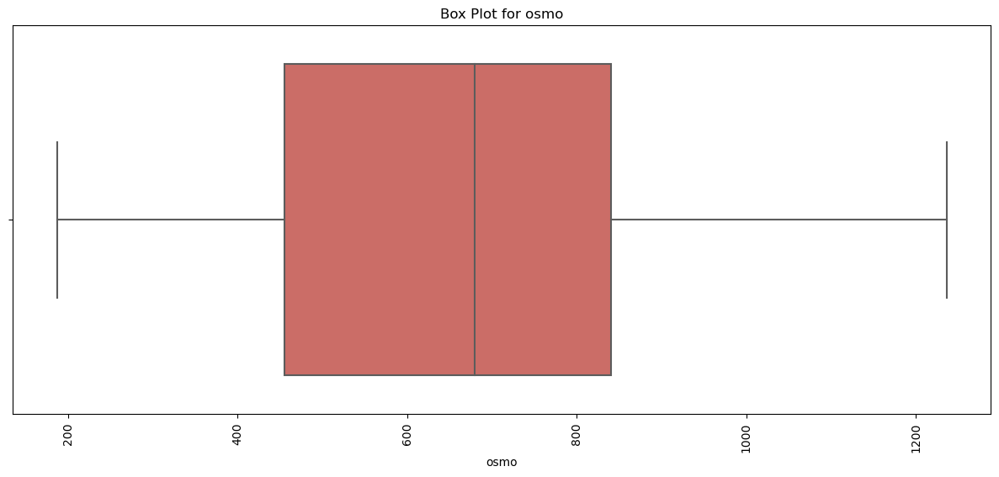

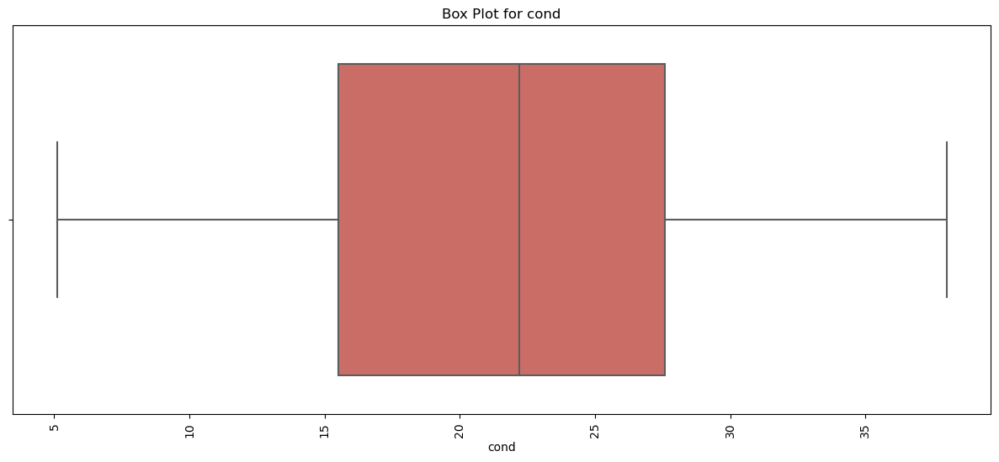

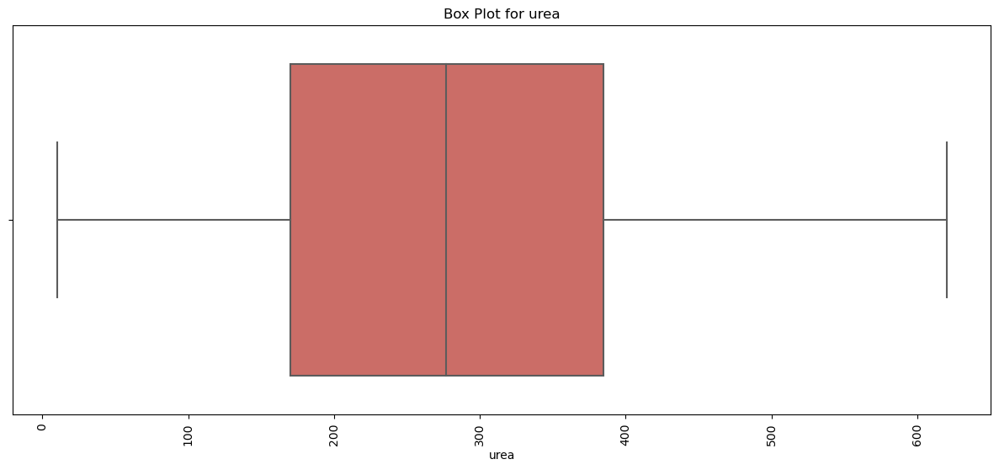

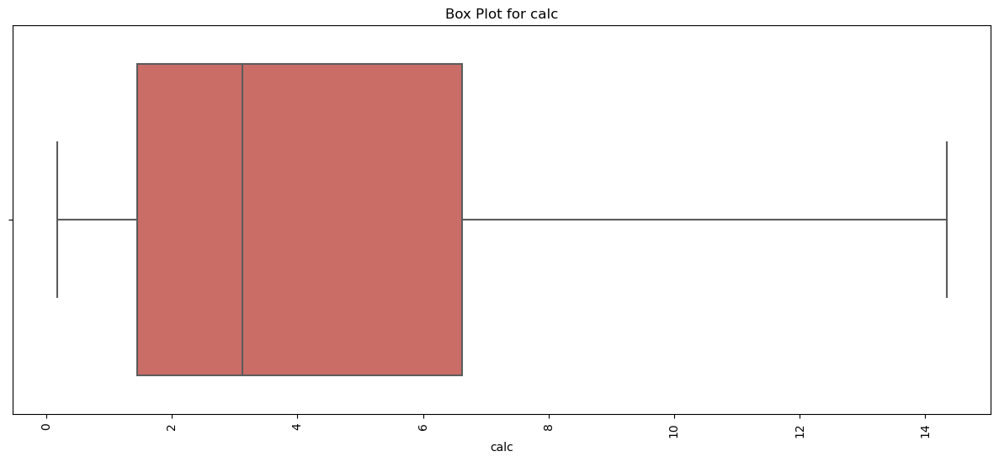

In [21]:
# Display the box plots for all independent columns using Seaborn library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a new figure for each plot
        plt.figure(figsize=(15, 6))
        
        # Create a box plot using seaborn
        sns.boxplot(x=i, data=df, palette='hls')
        
        # Customize the plot as needed
        plt.xticks(rotation=90)
        plt.title(f'Box Plot for {i}')
        
        # Display the plot
        plt.show()


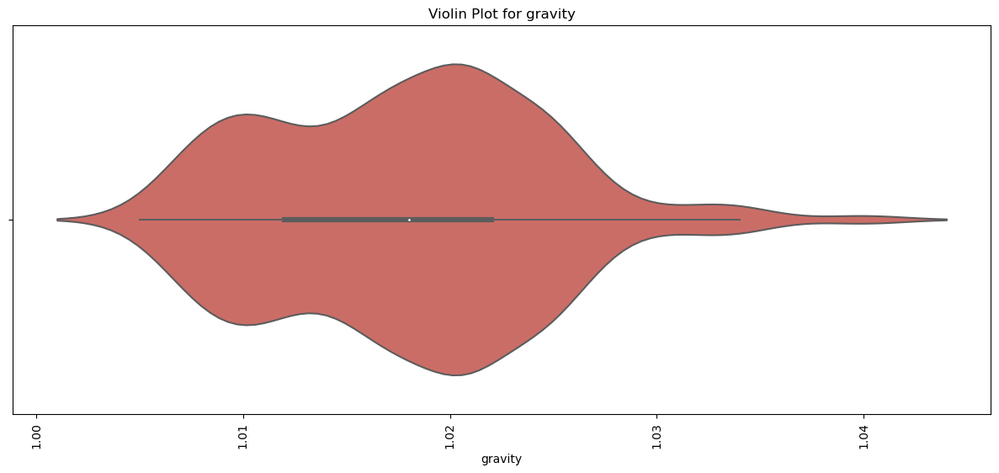

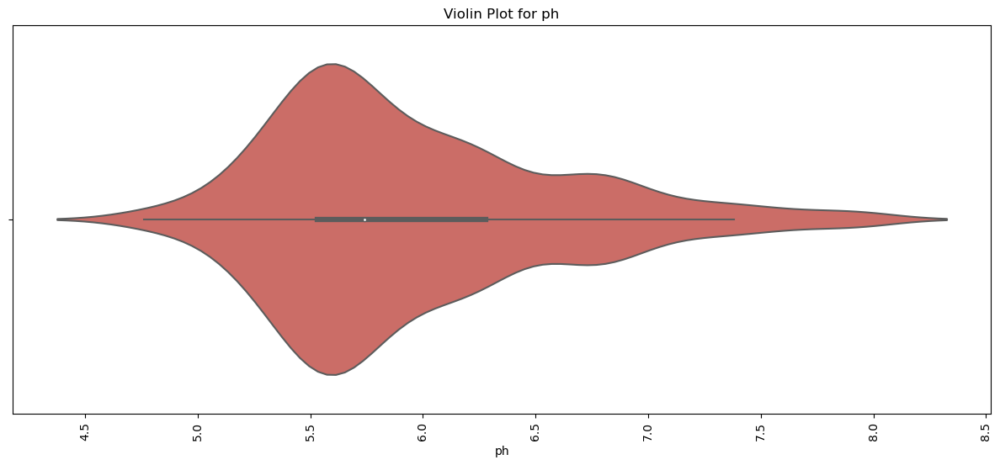

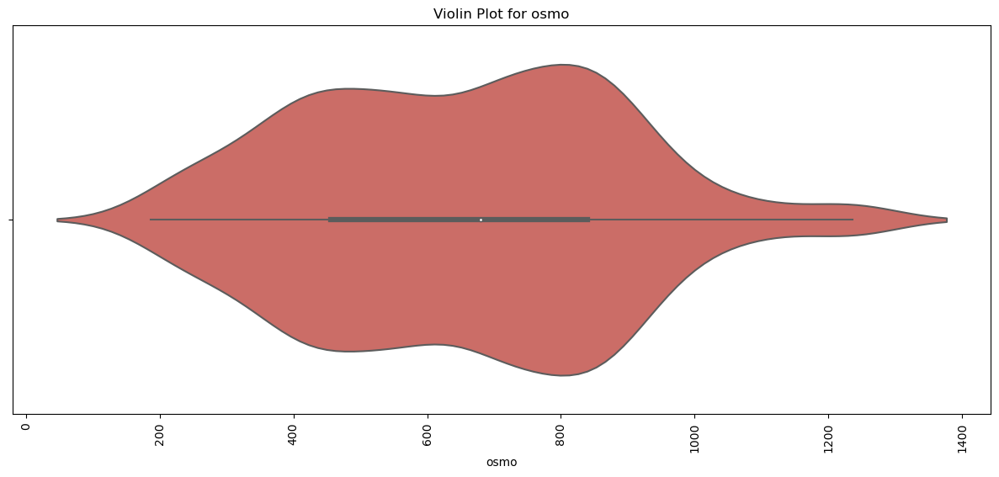

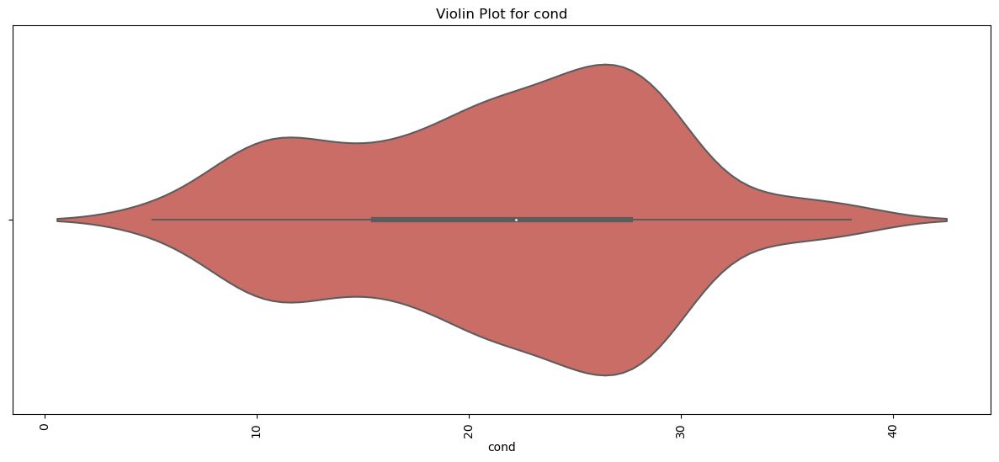

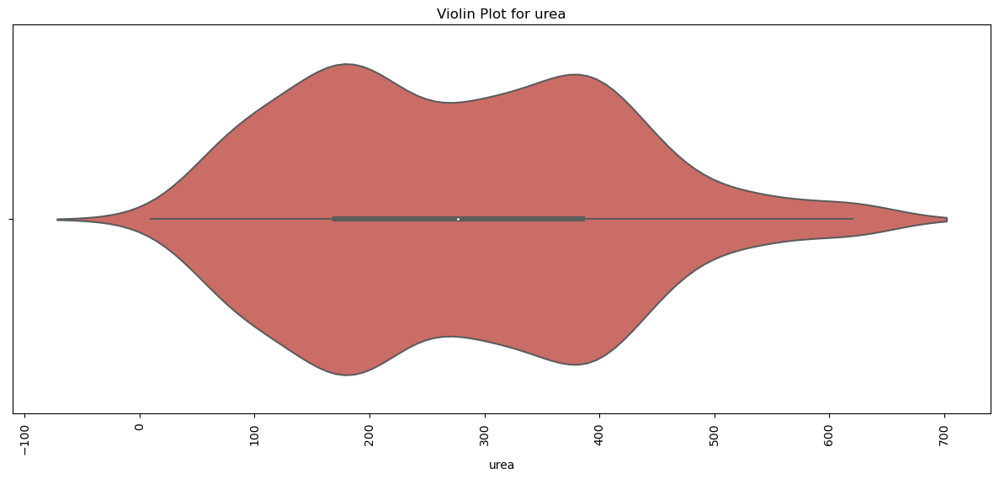

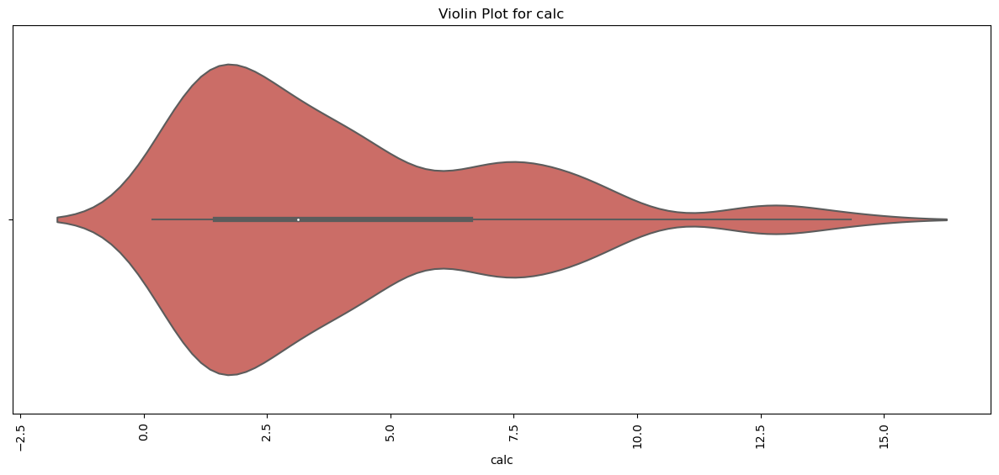

In [22]:
# Display the violin plots for all independent columns using Seaborn library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a new figure for each plot
        plt.figure(figsize=(15, 6))
        
        # Create a violin plot using seaborn
        sns.violinplot(x=i, data=df, palette='hls')
        
        # Customize the plot as needed
        plt.xticks(rotation=90)
        plt.title(f'Violin Plot for {i}')
        
        # Display the plot
        plt.show()


In [23]:
# Display the histograms with marginal box plots for all independent columns using Plotly library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a histogram with a marginal box plot using Plotly Express
        fig = px.histogram(df[i], nbins=20, color_discrete_sequence=['#636EFA'], 
                            marginal='box', opacity=0.7)
        
        # Customize the layout
        fig.update_layout(
            title=f'Histogram of {i}',
            xaxis_title=i,
            yaxis_title='Count',
            showlegend=False
        )
        
        # Display the plot
        fig.show()


In [24]:
# Display the histograms with marginal rug plots for all independent columns using Plotly library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a histogram with a marginal rug plot using Plotly Express
        fig = px.histogram(df, x=i, color_discrete_sequence=['#636EFA'], nbins=20, opacity=0.7, title=f'Histogram of {i}',
                           labels={'x': i, 'count': 'Frequency'}, template='plotly_white', width=800, height=400,
                           marginal='rug', barmode='overlay', hover_data=[df['target']])
        
        # Customize the layout
        fig.update_layout(
            xaxis=dict(type='category', title=i, tickangle=-90, tickfont=dict(size=10)),
            yaxis_title='Frequency',
            showlegend=False)
        
        # Display the plot
        fig.show()


In [25]:
# Display the box plots for all independent columns using Plotly library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a box plot using Plotly Express
        fig = px.box(df, x=df[i], color_discrete_sequence=['#636EFA'])
        
        # Customize the layout
        fig.update_layout(title='Box Plot of ' + i, xaxis_title=i, yaxis_title='Value',)
        
        # Display the plot
        fig.show()


In [26]:
# Display the violin plots for all independent columns using Plotly library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a violin plot using Plotly Express
        fig = px.violin(df, y=i, x='target', box=True, points="all", hover_data=df.columns)
        
        # Customize the layout
        fig.update_layout(title=i, xaxis_title="Target", yaxis_title=i)
        
        # Display the plot
        fig.show()


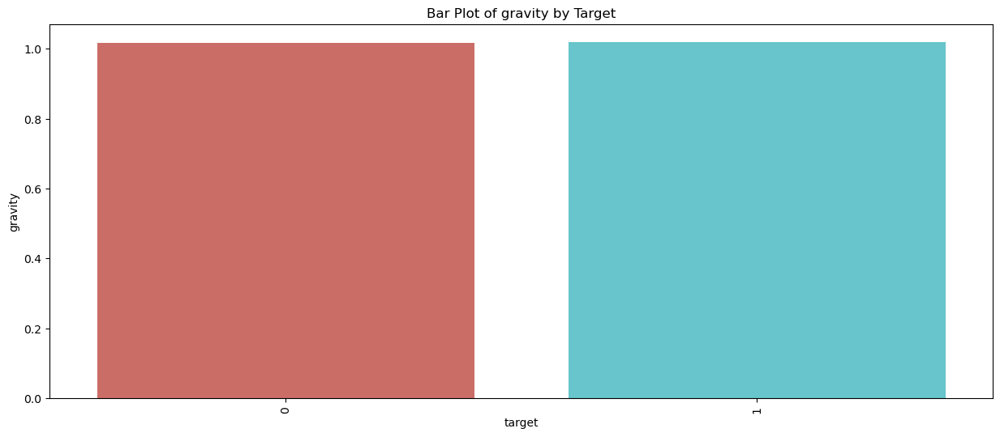

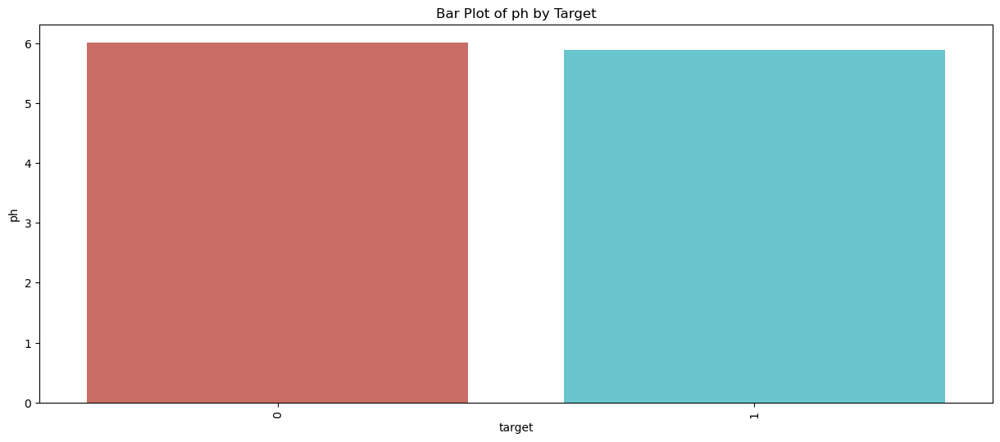

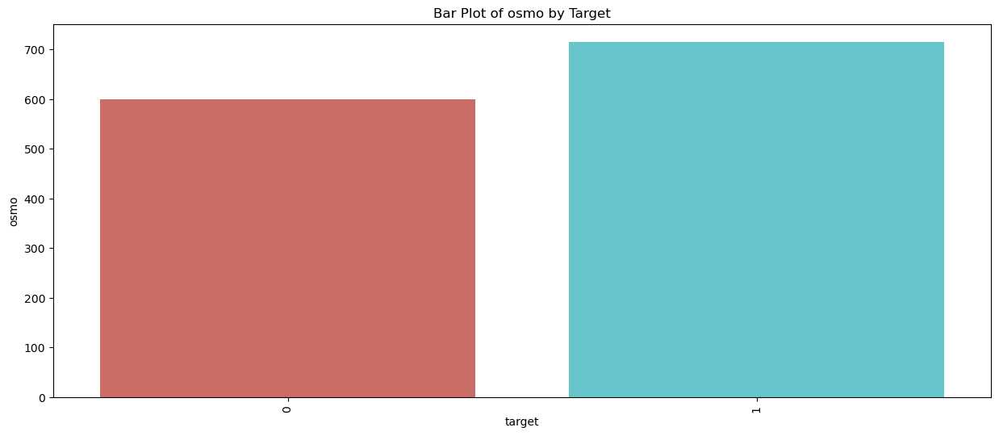

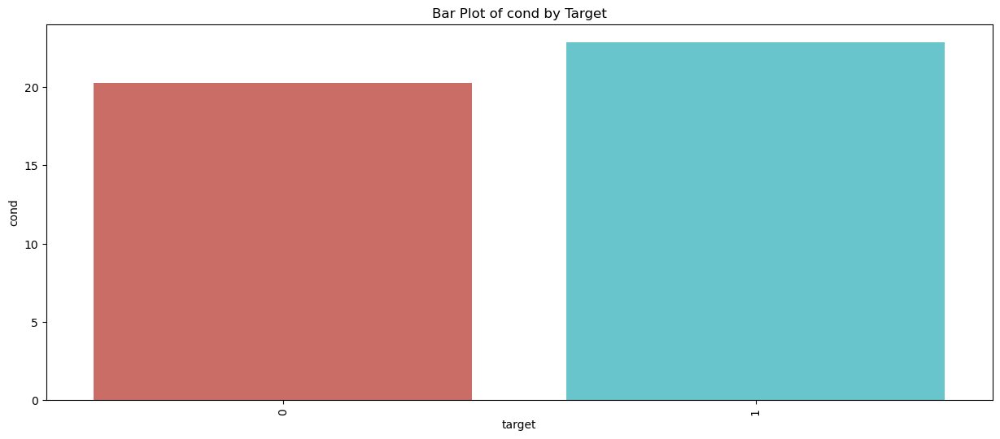

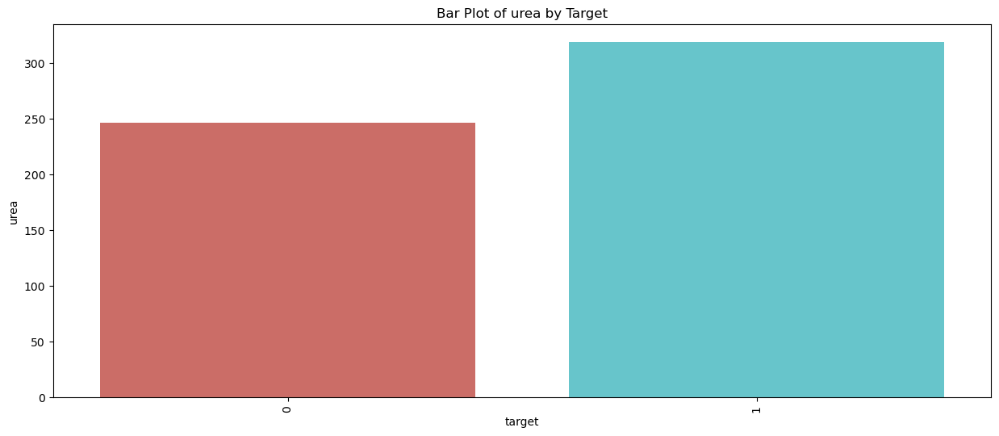

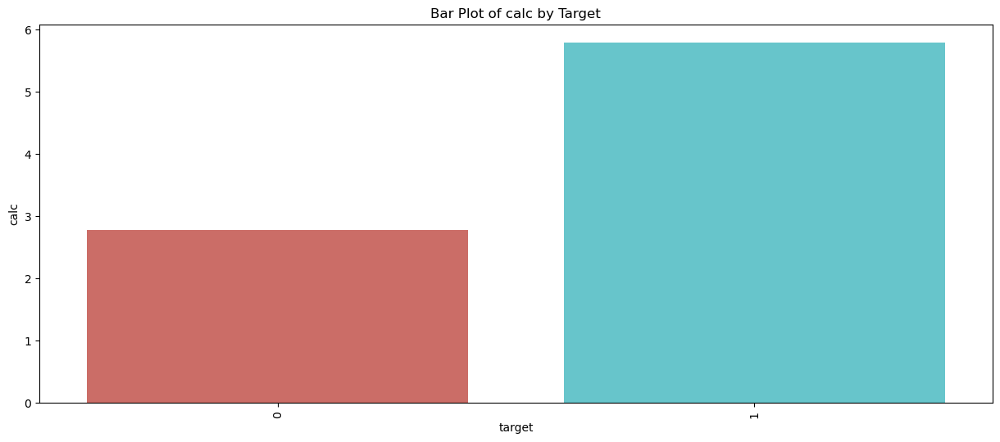

In [27]:
# Display the bar plots for all independent columns with respect to a dependent column using Seaborn library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a new figure for each plot
        plt.figure(figsize=(15, 6))
        
        # Create a bar plot using Seaborn
        sns.barplot(x='target', y=i, data=df, ci=None, palette='hls')
        
        # Customize the plot as needed
        plt.xticks(rotation=90)
        plt.title(f'Bar Plot of {i} by Target')
        
        # Display the plot
        plt.show()


In [28]:
# Display the bar plots for all independent columns with respect to a dependent column using Plotly library.

# Loop through columns
for i in df.columns:
    if i != 'target':
        # Create a bar plot using Plotly Express
        fig = px.bar(df, x="target", y=i, color="target", barmode="group")
        
        # Customize the layout
        fig.update_layout(title=f"{i} by Target", xaxis_title="Target", yaxis_title=i, legend_title="Target")
        
        # Display the plot
        fig.show()


In [29]:
# Display the scatter plots for all pairs of independent columns with respect to a dependent column using Plotly library.

# Loop through columns
for i in df.columns:
    for j in df.columns:
        if i != j and i != 'target':
            # Create a scatter plot using Plotly Express
            fig = px.scatter(
                df, 
                x=i, 
                y=j, 
                color='target', 
                color_discrete_sequence=['#636EFA', '#EF553B']
            )
            
            # Customize the layout
            fig.update_layout(
                title=f'Scatter Plot of {i} vs {j}', 
                xaxis_title=i, 
                yaxis_title=j
            )
            
            # Display the plot
            fig.show()


In [30]:
# Display the scatter plots for 'gravity', 'ph', 'osmo columns with respect to a dependent column using Plotly library.

fig = go.Figure(data=[go.Scatter3d(
    x=df['gravity'],
    y=df['ph'],
    z=df['osmo'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['target'],
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(
    title='3D Scatter Plot',
    scene=dict(
        xaxis_title='Gravity',
        yaxis_title='pH',
        zaxis_title='Osmo'
    )
)

fig.show()

<Figure size 1500x600 with 0 Axes>

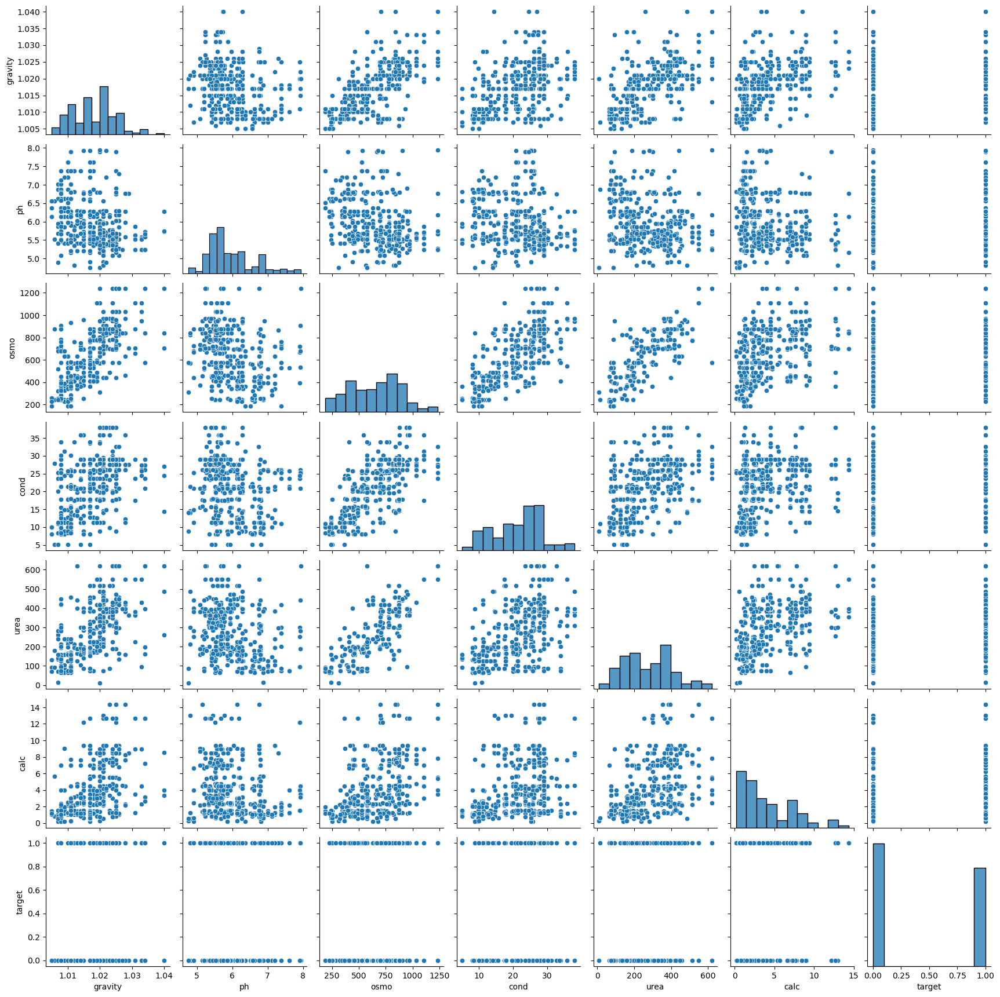

In [31]:
# Display the pair plots for different combinations of columns using Seaborn library.

plt.figure(figsize=(15,6))                    # figure size
sns.pairplot(data = df, palette = 'hls')      # Create a pair plot for the specified columns
plt.xticks(rotation = 90)                     # rotation angle for the tick labels on the x-axis
plt.show()                                    # Show the plot

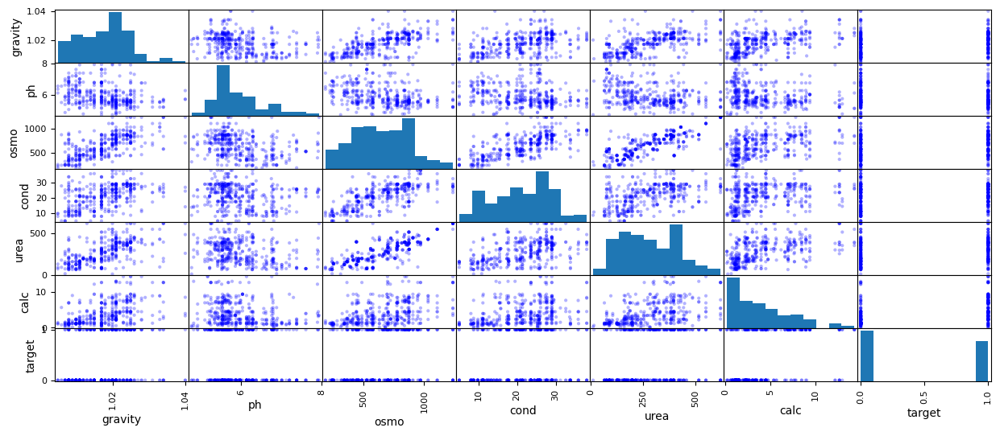

In [32]:
# Display the pair plots for different combinations of independent columns with respect to a dependent column using Plotly.

from pandas.plotting import scatter_matrix
scatter_matrix(df, diagonal='hist', color='b', alpha=0.3, figsize=(15,6))
fig = go.Figure(data=px.scatter_matrix(df, color='target', dimensions=['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']))
fig.update_layout(title='Pairplot of Features', width=800, height=800)
fig.show()

In [33]:
# Calculate the IQR values for each columns and display it on conslole.

Q1 = df.quantile(0.25)       # Calculate the 1st quartile (25th percentile) of the DataFrame 'df'.
Q3 = df.quantile(0.75)       # Calculate the 3rd quartile (75th percentile) of the DataFrame 'df'.
IQR = Q3 - Q1                # Calculate the Interquartile Range (IQR) for each column in the DataFrame.
print(IQR)                   # Print the calculated IQR values for each column.

gravity      0.01
ph           0.75
osmo       384.75
cond        12.10
urea       215.00
calc         5.18
target       1.00
dtype: float64


In [34]:
# Create a new DataFrame 'df_new' by applying a filter to the original DataFrame 'df'.
# This filter removes rows that contain outliers based on the IQR method.
df_new = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis = 1)]

In [35]:
# Let’s have a look at data dimensionality of the 'df_new'.
df_new.shape

(399, 7)

In [36]:
# Calculate the Two-Sample Independent t-Test for 'urea' Values Between Group 1 and Group 2 with respect to a target (0, 1)

# Import the ttest_ind function from the scipy.stats module.
from scipy.stats import ttest_ind

# Select data for group 1 where 'target' is 0 and specifically the 'urea' column.
group1 = df[df['target'] == 0]['urea']

# Select data for group 2 where 'target' is 1 and specifically the 'urea' column.
group2 = df[df['target'] == 1]['urea']

# Calculate the mean and standard deviation for group 1 ('urea' values for 'target' 0).
mean1, std1 = group1.mean(), group1.std()

# Calculate the mean and standard deviation for group 2 ('urea' values for 'target' 1).
mean2, std2 = group2.mean(), group2.std()

# Perform a two-sample independent t-test to compare the means of group 1 and group 2.
# The equal_var=False parameter is used because we assume the variances of the two groups are not equal.
t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

# Print the calculated statistics and results.
print('Group 1 mean: {:.2f}, std: {:.2f}'.format(mean1, std1))
print('Group 2 mean: {:.2f}, std: {:.2f}'.format(mean2, std2))
print('t-statistic: {:.2f}, p-value: {:.2f}'.format(t_stat, p_value))


Group 1 mean: 246.33, std: 137.93
Group 2 mean: 319.07, std: 123.50
t-statistic: -5.65, p-value: 0.00


In summary, based on the t-test results, there is a statistically significant difference in the 'urea' values between Group 1 (target 0) and Group 2 (target 1), with Group 2 having a higher mean 'urea' value compared to Group 1.

In [37]:
# Calculate the correlation matrix for the DataFrame 'df'.
df_corr = df.corr()

# Print the correlation matrix.
df_corr

,gravity,ph,osmo,cond,urea,calc,target
gravity,1.000000,-0.290349,0.692317,0.470433,0.631710,0.494304,0.282577
ph,-0.290349,1.000000,-0.309495,-0.190185,-0.279749,-0.214402,-0.094983
osmo,0.692317,-0.309495,1.000000,0.708480,0.809880,0.472114,0.244770
cond,0.470433,-0.190185,0.708480,1.000000,0.499109,0.330609,0.172224
urea,0.631710,-0.279749,0.809880,0.499109,1.000000,0.489879,0.265211
calc,0.494304,-0.214402,0.472114,0.330609,0.489879,1.000000,0.467439
target,0.282577,-0.094983,0.244770,0.172224,0.265211,0.467439,1.000000


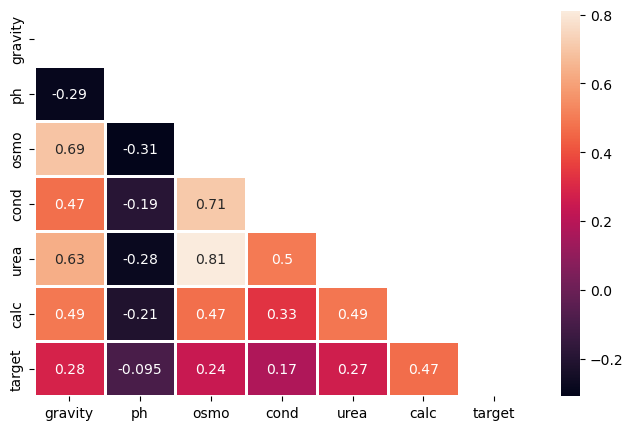

In [38]:
# Create a heatmap using Seaborn to visualize the correlation matrix.

# Create a Matplotlib figure with a specified size of 10x8 inches.
plt.figure(figsize=(8, 5))

# Create an upper triangular matrix 'matrix' from the correlation matrix to mask lower triangle values.
matrix = np.triu(df_corr)

# Create a heatmap using Seaborn to visualize the correlation matrix.
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket")

# Display the heatmap plot.
plt.show()

In [39]:
# Create a correlation heatmap using Plotly Express, based on the correlation matrix of the DataFrame 'df'.
fig = px.imshow(df.corr(), color_continuous_scale='RdBu')

# Customize the layout of the heatmap plot.
fig.update_layout(title='Correlation Heatmap', xaxis_title='Features', yaxis_title='Features',)

# Show the heatmap plot.
fig.show()

## Feature Engineering and Standardization

In [40]:
# Copy of the original DataFrame 'df' as 'df1'
df1 = df.copy()

In [41]:
df1['osmo_cond_ratio'] = df['osmo'] / df['cond']

# Create a new feature by subtracting calc from urea
df1['urea_calc_diff'] = df['urea'] - df['calc']

# Standardize the values of gravity, ph, osmo, cond, urea, and calc
df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] = (df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] - df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].mean()) / df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].std()

# Create a new feature by multiplying osmo by urea
df1['osmo_urea_interaction'] = df['osmo'] * df['urea']

# Categorize the values of gravity, ph, osmo, cond, urea, and calc into 5 bins each
df1['gravity_bin'] = pd.qcut(df['gravity'], 5, labels=False)
df1['ph_bin'] = pd.qcut(df['ph'], 5, labels=False)
df1['osmo_bin'] = pd.qcut(df['osmo'], 5, labels=False)
df1['cond_bin'] = pd.qcut(df['cond'], 5, labels=False)
df1['urea_bin'] = pd.qcut(df['urea'], 5, labels=False)
df1['calc_bin'] = pd.qcut(df['calc'], 5, labels=False)

In [42]:
# Display the first 5 rows of a DataFrame (df1)
df1.head()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
0,-0.733145,0.365181,-0.888652,-0.883319,-1.133498,-0.828134,0,29.932432,122.55,54932,1,3,1,1,0,1
1,1.064616,-0.864851,0.219255,0.287711,0.845361,0.020314,0,29.788136,389.82,276982,4,0,2,2,3,3
2,-1.332398,0.271761,-1.195458,0.407476,-0.876979,1.530737,0,15.142857,149.96,58989,0,3,0,2,0,4
3,0.465362,-1.627781,-0.892914,-0.084889,0.874678,0.781741,1,21.250000,391.37,175916,3,0,0,1,4,3
4,0.465362,-0.662440,0.947918,-0.484104,0.779399,-0.591936,1,49.101124,382.79,336490,3,1,4,1,3,1


In [43]:
# Display the last 5 rows of a DataFrame (df1)
df1.tail()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
409,-1.032771,-1.160681,-0.530713,-0.005046,-1.492624,-0.803271,0,24.626168,73.47,39525,0,0,1,2,0,1
410,0.914802,-0.662440,-0.317654,-0.231268,-0.400587,-1.039469,0,29.289340,223.23,129248,3,1,1,1,2,0
411,0.015922,0.505311,-0.837518,0.101411,-0.063448,1.108067,1,20.495495,262.32,122850,2,3,1,2,2,4
412,-1.482211,1.813192,-1.391472,-1.176077,-1.492624,-0.958664,1,25.793651,73.97,24375,0,4,0,0,0,0
413,-1.032771,0.271761,-1.225286,-1.535370,-0.876979,-1.194862,0,36.767677,158.73,57876,0,3,0,0,0,0


## Train/Test Split

<b> Creating independent variables as "X" variable and dependent variable "target" as "y" variable.

In [44]:
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction', 'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin', 'calc_bin']]
y = df1['target']

In [45]:
# import train_test_split from scikit-learn library.
from sklearn.model_selection import train_test_split

# Apply the train_test_split() function.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the length of the 'x_train', 'x_test', 'y_train' and 'y_test'.
print(len(X_train), len(y_train))
print(len(X_test), len(y_test))

331 331
83 83


## Modelling and Evaluation:

### 1. Logistic Regression Modelling and Evaluation

In [46]:
# import the LogisticRegression from sklearn.linear_model library.
from sklearn.linear_model import LogisticRegression

# import the evaluation metrics. 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# initialize the 'LogisticRegression' model as 'lr'
lr = LogisticRegression(random_state=42)

# Train the model.
lr.fit(X_train, y_train)

# Predict on the test dataset.
y_pred = lr.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6746987951807228
Precision: 0.6896551724137931
Recall: 0.5263157894736842
F1 Score: 0.5970149253731344
Confusion matrix: [[36  9]
 [18 20]]
Classification report:               precision    recall  f1-score   support

           0       0.67      0.80      0.73        45
           1       0.69      0.53      0.60        38

    accuracy                           0.67        83
   macro avg       0.68      0.66      0.66        83
weighted avg       0.68      0.67      0.67        83



### Hyper-parameter tuning to find the best parameters for the Logistic Regression model.

In [47]:
# import the 'GridSearchCV' from the sklearn library.
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters to tune
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

# Perform grid search cross-validation to find the best hyperparameters
lr = LogisticRegression(random_state=42)
grid_search = GridSearchCV(lr, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding mean cross-validation score
print('Best Hyperparameters:', grid_search.best_params_)
print('Best Mean Cross-Validation Score:', grid_search.best_score_)

Best Hyperparameters: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
Best Mean Cross-Validation Score: 0.7519674355495252


### 2. Decision Tree Modelling and Evaluation

In [48]:
# import the 'DecisionTreeClassifier' from sklearn library.
from sklearn.tree import DecisionTreeClassifier

# initialize the 'DecisionTreeClassifier' model as 'dtc'
dtc = DecisionTreeClassifier(random_state=42)

# Train the model.
dtc.fit(X_train, y_train)

# Predict on the test dataset.
y_pred = dtc.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6867469879518072
Precision: 0.7
Recall: 0.5526315789473685
F1 Score: 0.6176470588235295
Confusion matrix: [[36  9]
 [17 21]]
Classification report:               precision    recall  f1-score   support

           0       0.68      0.80      0.73        45
           1       0.70      0.55      0.62        38

    accuracy                           0.69        83
   macro avg       0.69      0.68      0.68        83
weighted avg       0.69      0.69      0.68        83



### Hyper-parameter tuning to find the best parameters for the Decision Tree model.

In [49]:
# Define the hyperparameters to tune
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search cross-validation to find the best hyperparameters
dtc = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(dtc, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding mean cross-validation score
print('Best Hyperparameters:', grid_search.best_params_)
print('Best Mean Cross-Validation Score:', grid_search.best_score_)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Mean Cross-Validation Score: 0.7038444142921755


### 3. Random Forest Modelling and Evaluation

In [50]:
# import the 'RandomForestClassifier' from sklearn library.
from sklearn.ensemble import RandomForestClassifier

# initialize the 'RandomForestClassifier' model as 'rfc'
rfc = RandomForestClassifier(random_state=42)

# Train the model.
rfc.fit(X_train, y_train)

# Predict on the test dataset.
y_pred = rfc.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6987951807228916
Precision: 0.7096774193548387
Recall: 0.5789473684210527
F1 Score: 0.6376811594202899
Confusion matrix: [[36  9]
 [16 22]]
Classification report:               precision    recall  f1-score   support

           0       0.69      0.80      0.74        45
           1       0.71      0.58      0.64        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.69        83



### Hyper-parameter tuning to find the best parameters for the Random Forest model.

In [51]:
# initialize the 'RandomForestClassifier' model as 'rfc'
rfc = RandomForestClassifier(random_state=42)

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search cross-validation to find the best hyperparameters
grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding mean cross-validation score
print('Best hyperparameters:', grid_search.best_params_)
print('Accuracy:', grid_search.best_score_)


best_rfc = grid_search.best_estimator_
y_pred = best_rfc.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.7398914518317504
Accuracy: 0.6987951807228916
Precision: 0.696969696969697
Recall: 0.6052631578947368
F1 Score: 0.6478873239436619
Confusion matrix: [[35 10]
 [15 23]]
Classification report:               precision    recall  f1-score   support

           0       0.70      0.78      0.74        45
           1       0.70      0.61      0.65        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.70        83



### 4. XGBClassifier Classifier Modelling and Evaluation

In [52]:
# import the 'XGBClassifier' from xgboost library.
from xgboost import XGBClassifier

# initialize the 'XGBClassifier' model as 'xgb'
xgb = XGBClassifier(random_state=42)

# Train the model.
xgb.fit(X_train, y_train)

# Predict on the test dataset.
y_pred = xgb.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.7108433734939759
Precision: 0.71875
Recall: 0.6052631578947368
F1 Score: 0.6571428571428571
Confusion matrix: [[36  9]
 [15 23]]
Classification report:               precision    recall  f1-score   support

           0       0.71      0.80      0.75        45
           1       0.72      0.61      0.66        38

    accuracy                           0.71        83
   macro avg       0.71      0.70      0.70        83
weighted avg       0.71      0.71      0.71        83



### Hyper-parameter tuning to find the best parameters for the XGBoost Classifier model.

In [53]:
# Define the hyperparameters to tune
params = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
}

# initialize the 'XGBClassifier' model as 'xgb'
xgb = XGBClassifier(random_state=42)

# Perform grid search cross-validation to find the best hyperparameters
grid_search = GridSearchCV(xgb, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding mean cross-validation score
print('Best Hyperparameters:', grid_search.best_params_)
print('Best Accuracy:', grid_search.best_score_)

y_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best Hyperparameters: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 50}
Best Accuracy: 0.7159203980099502
Accuracy: 0.7349397590361446
Precision: 0.7105263157894737
Recall: 0.7105263157894737
F1 Score: 0.7105263157894737
Confusion matrix: [[34 11]
 [11 27]]
Classification report:               precision    recall  f1-score   support

           0       0.76      0.76      0.76        45
           1       0.71      0.71      0.71        38

    accuracy                           0.73        83
   macro avg       0.73      0.73      0.73        83
weighted avg       0.73      0.73      0.73        83



### 5. Support Vector Machine (SVC) Modelling and Evaluation

In [54]:
# import the 'SVC' from sklearn library.
from sklearn.svm import SVC

# initialize the 'SVC' model as 'svc'
svc = SVC(kernel='linear', random_state=42)

# Train the model.
svc.fit(X_train, y_train)

# Predict on the test dataset.
y_pred = svc.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6746987951807228
Precision: 0.6170212765957447
Recall: 0.7631578947368421
F1 Score: 0.6823529411764706
Confusion matrix: [[27 18]
 [ 9 29]]
Classification report:               precision    recall  f1-score   support

           0       0.75      0.60      0.67        45
           1       0.62      0.76      0.68        38

    accuracy                           0.67        83
   macro avg       0.68      0.68      0.67        83
weighted avg       0.69      0.67      0.67        83



### Building LSTM model 

In [55]:
# Display the shape of the 'X_train'
X_train.shape

(331, 15)

In [56]:
# Display the columns of the DataFrame 'df1'
df1.columns

Index(['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target',
       'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction',
       'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin',
       'calc_bin'],
      dtype='object')

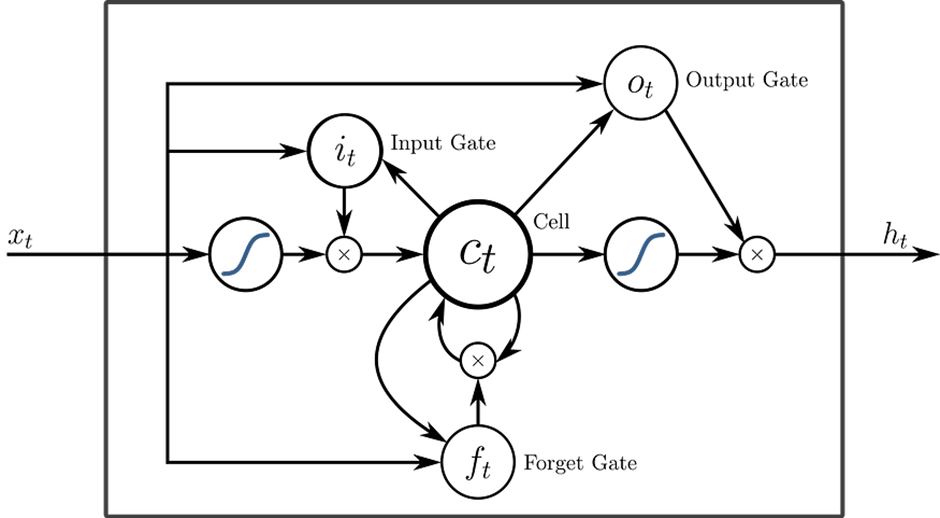

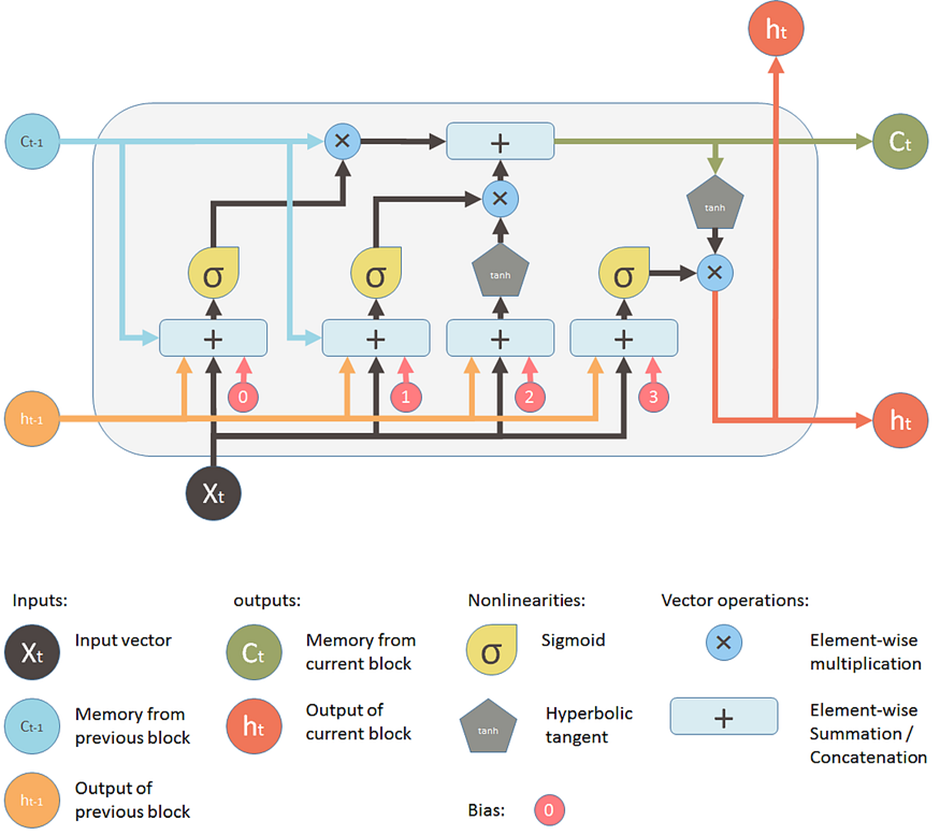

In [57]:
# Import the necessary libraries for LSTM 

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPooling1D, Bidirectional, LSTM
from keras.callbacks import EarlyStopping
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, Dropout, Bidirectional, LSTM
from sklearn.model_selection import train_test_split

In [58]:
# Define X and y
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction', 'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin', 'calc_bin']]
y = df1['target']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape X_train and X_test to be 3D arrays
X_train = np.reshape(X_train.to_numpy(), (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test.to_numpy(), (X_test.shape[0], X_test.shape[1], 1))

# Define the model
model = Sequential()

# Convolutional layers
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Conv1D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(Conv1D(filters=128, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.2))

# BiLSTM layers
model.add(Bidirectional(LSTM(128, return_sequences=True)))
model.add(Bidirectional(LSTM(64)))
model.add(Dropout(0.2))

# Dense layers
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=75, batch_size=64, validation_split=0.2)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test accuracy:', accuracy)


Epoch 1/75
5/5 [==============================] - 20s 784ms/step - loss: 0.6925 - accuracy: 0.5606 - val_loss: 0.6884 - val_accuracy: 0.5522
Epoch 2/75
5/5 [==============================] - 0s 83ms/step - loss: 0.6926 - accuracy: 0.5227 - val_loss: 0.6910 - val_accuracy: 0.5821
Epoch 3/75
5/5 [==============================] - 0s 80ms/step - loss: 0.7008 - accuracy: 0.4924 - val_loss: 0.6944 - val_accuracy: 0.5522
Epoch 4/75
5/5 [==============================] - 0s 75ms/step - loss: 0.6933 - accuracy: 0.5530 - val_loss: 0.6839 - val_accuracy: 0.5522
Epoch 5/75
5/5 [==============================] - 0s 83ms/step - loss: 0.6826 - accuracy: 0.5568 - val_loss: 0.6819 - val_accuracy: 0.5522
Epoch 6/75
5/5 [==============================] - 0s 79ms/step - loss: 0.6809 - accuracy: 0.5720 - val_loss: 0.6809 - val_accuracy: 0.5522
Epoch 7/75
5/5 [==============================] - 0s 81ms/step - loss: 0.6788 - accuracy: 0.5606 - val_loss: 0.6777 - val_accuracy: 0.5522
Epoch 8/75
5/5 [=========

5/5 [==============================] - 0s 102ms/step - loss: 0.5121 - accuracy: 0.7652 - val_loss: 0.7019 - val_accuracy: 0.6119
Epoch 60/75
5/5 [==============================] - 1s 102ms/step - loss: 0.5157 - accuracy: 0.7614 - val_loss: 0.6894 - val_accuracy: 0.6119
Epoch 61/75
5/5 [==============================] - 0s 93ms/step - loss: 0.5216 - accuracy: 0.7727 - val_loss: 0.7140 - val_accuracy: 0.5970
Epoch 62/75
5/5 [==============================] - 0s 94ms/step - loss: 0.5342 - accuracy: 0.7348 - val_loss: 0.6793 - val_accuracy: 0.5970
Epoch 63/75
5/5 [==============================] - 0s 72ms/step - loss: 0.5166 - accuracy: 0.7652 - val_loss: 0.6894 - val_accuracy: 0.5821
Epoch 64/75
5/5 [==============================] - 0s 103ms/step - loss: 0.5057 - accuracy: 0.7538 - val_loss: 0.6995 - val_accuracy: 0.5970
Epoch 65/75
5/5 [==============================] - 1s 122ms/step - loss: 0.4992 - accuracy: 0.7917 - val_loss: 0.7405 - val_accuracy: 0.5821
Epoch 66/75
5/5 [===========

In [59]:
# Save the model
model.save('my_model.h5')

### Analysis and Conclusion

After comparing various machine learning and Deep Learning algorithms, including XGBoost (XGBClassifier), Random Forest (RF), Decision Tree (DT), Logistic Regression (LR), Support Vector Machine (SVM) and LSTM, we observed that the LSTM model yielded the highest test accuracy. Specifically, the LSTM model achieved a test accuracy of 76%. Therefore, based on these performance metrics, we have selected LSTM model as the best-performing model for our task.